# Global Wheat Detection EDA

**참고 notebook**<br>
https://www.kaggle.com/rohitsingh9990/simpleeda-visualizations
https://www.kaggle.com/devvindan/wheat-detection-eda

**[목표]**<br><br>
전세계 밀 사진 데이터에서 밀머리의 수와 크기를 추정하기.<br>
밀머리가 없다면 bbox 도 없어야 함

**[훈련데이터]**<br><br>
유럽(프랑스, 영국, 스위스), 북미(캐나다)의 3천여개 이상의 이미지

**[테스트데이터]**<br><br>
호주, 일본, 중국의 1천개 이미지

**[데이터셋 구성]**
- train.csv - 훈련 데이터
- sample_submission.csv - 올바른 형식의 제출 파일
- train.zip - 훈련 이미지 (3422장)
- test.zip - 테스트 이미지 (10장)

**[train.csv 요소]**
- image_id - 이미지 이름
- width - 이미지의 넓이
- height - 이미지의 높이
- bbox - [xmin, ymin, width, height]를 가지는 경계 상자
- source - 데이터 출처

In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
import socket
hostname = socket.gethostname()
print(hostname)

devbox20


In [3]:
!pwd

/home/hyerin/work/repos/23_Global_Wheat_Detection


### 라이브러리

In [4]:
import pandas as pd  # package for high-performance, easy-to-use data structures and data analysis
import numpy as np  # fundamental package for scientific computing with Python
import matplotlib
import os

In [5]:
from PIL import Image, ImageDraw
from ast import literal_eval
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

### 데이터 불러오기 

In [25]:
#csv 파일 로드
BASE_PATH = '/home/hyerin/data/global-wheat-detection'
train = pd.read_csv(f'{BASE_PATH}/train.csv')
submission = pd.read_csv(f'{BASE_PATH}/sample_submission.csv')
print("train.csv - length : ", len(train))
display(train.head())

train.csv - length :  147793


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
#사진 파일 경로 지정
BASE_PATH = '/home/hyerin/data/global-wheat-detection'
TRAIN_DIR = f'{BASE_PATH}/train'
TEST_DIR = f'{BASE_PATH}/test'
print(TRAIN_DIR)
print(TEST_DIR)

/home/hyerin/data/global-wheat-detection/train
/home/hyerin/data/global-wheat-detection/test


**전체 사진파일 개수, bbox 데이터를 가지는 사진 파일 개수 파익하기**

train.csv 에는 같은 image_id 를 가진 bbox 데이터가 여러개 존재한다.<br>
train.csv 에 bbox 정보가 없는 이미지 사진이 있을 수 있다.<br>
bbox 는 [x, y, w, h]

In [8]:
unique_images = train['image_id'].unique() # 중복되는 imsga_id 제거
num_total = len(os.listdir(TRAIN_DIR))     # 전체 사진 개수
num_annotated = len(unique_images)    

In [9]:
print("bbox가 있는 이미지가 {}장, bbox가 없는 이미지가 {}장 있습니다.".format(
    num_total, num_total - num_annotated))

bbox가 있는 이미지가 3422장, bbox가 없는 이미지가 49장 있습니다.


**모든 사진의 크기가 동일한지 확인**

In [10]:
print("- height 이 모두 동일한가? ", train['height'].unique() == [1024])
print("- width 이 모두 동일한가? ", train['width'].unique() == [1024])

- height 이 모두 동일한가?  [ True]
- width 이 모두 동일한가?  [ True]


**이미지마다 몇개의 bbox가 있는지 확인**

In [11]:
train['image_id'].value_counts()

35b935b6c    116
f1794c924    108
f79336a8e    104
134d4a01c    101
4cf91995d     97
            ... 
4e6c05213      1
41457a646      1
76595919e      1
6a62af644      1
47a1184e4      1
Name: image_id, Length: 3373, dtype: int64

<AxesSubplot:>

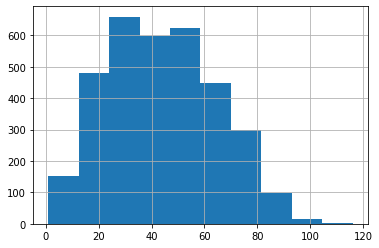

In [12]:
train['image_id'].value_counts().hist()

**이미지 출처별 개수 확인**

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_count(df, feature, title='', size=2):
    f, ax = plt.subplots(1,1, figsize=(4*size,3*size))
    total = float(len(df))
    sns.countplot(df[feature],order = df[feature].value_counts().index, palette='Set2')
    plt.title(title)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()

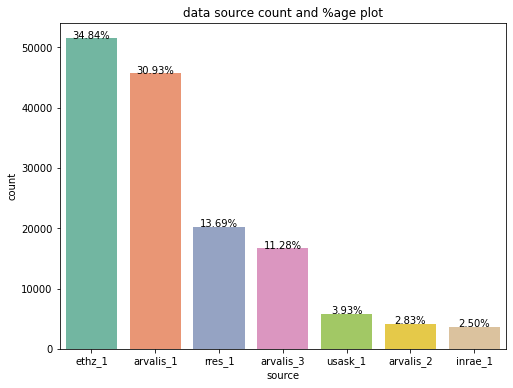

In [14]:
plot_count(df=train, feature='source', title = 'data source count and %age plot', size=2)

- 'source'는 데이터를 제공한 연구소 이름
- 제공된 source 측면에서 데이터셋의 균형이 맞지 않음
- 'ethz_1' and 'arvalis_1'가 전체의 65%가 넘는 것을 확인 가능 

In [15]:
display(train.describe())

,width,height
count,147793.0,147793.0
mean,1024.0,1024.0
std,0.0,0.0
min,1024.0,1024.0
25%,1024.0,1024.0
50%,1024.0,1024.0
75%,1024.0,1024.0
max,1024.0,1024.0


**결측값 확인**<br>

결측값은 분석오류를 발생시키거나 왜곡시킬 위험이 있음<br>
데이터가 있으면 결측값이 있는지 확인해야 함<br>
isnull() 메소드를 사용해서 결측인지 확인. 결측이면 True<br>
column 별 결측값 개수 구하기 : df.isnull().sum()

In [16]:
# 결측값 확인 예제 코드
df = pd.DataFrame({"a":[1,2,3,4],"b":[1,2,3,6],"c":[1, None, 3, 5]})
display(df)

check = df.isnull()
print(check)

total = df.isnull().sum() # True 인 값만 더해서 반환
print(total)

,a,b,c
0,1,1,1.0
1,2,2,NaN
2,3,3,3.0
3,4,6,5.0


       a      b      c
0  False  False  False
1  False  False   True
2  False  False  False
3  False  False  False
a    0
b    0
c    1
dtype: int64


In [17]:
total = train.isnull()
total_null_sum = train.isnull().sum()#.sort_values(ascending = False)
total_null_count = train.isnull().count()#.sort_values(ascending = False)

percent_null = ( total_null_sum/
                (total_null_count * 100)).sort_values(ascending = False)

missing_train_data = pd.concat([total_null_sum, percent_null], 
                               axis=1, keys=['total', 'percent'])
display(missing_train_data)

,total,percent
image_id,0,0.0
width,0,0.0
height,0,0.0
bbox,0,0.0
source,0,0.0


**Train Data 이미지 불러오기**

/home/hyerin/data/global-wheat-detection/train/b70c20580.jpg


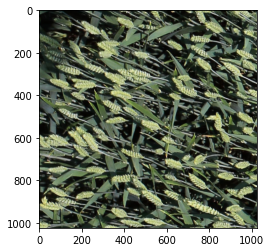

In [18]:
# bbox 개수가 많았던 이미지 확인해보기
image_path = os.path.join(TRAIN_DIR, 'b70c20580.jpg')
print(image_path)
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

plt.figure(figsize = (4,4))
plt.imshow(image)
plt.show()

In [19]:
# bbox 가 들어있는 index 확인해보기
print((train['image_id'] == 'b70c20580').sort_values(ascending=False))

61161     True
61153     True
61127     True
61128     True
61129     True
         ...  
98528    False
98527    False
98526    False
98525    False
0        False
Name: image_id, Length: 147793, dtype: bool


/home/hyerin/data/global-wheat-detection/train/b70c20580.jpg
bounding box 개수 :  97


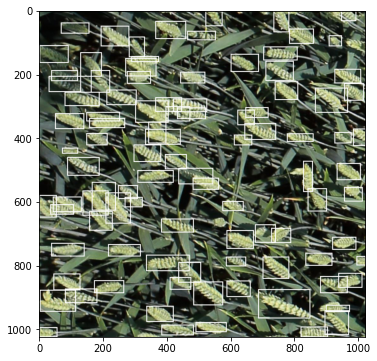

In [20]:
# 이미지 위에 bbox 그리기
image_path = os.path.join(TRAIN_DIR, 'b70c20580.jpg')
print(image_path)
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

bboxes = [literal_eval(box) for box in train[train['image_id']=='b70c20580']['bbox']]
print('bounding box 개수 : ', len(bboxes))

for bbox in bboxes:
    draw.rectangle([bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]], width=3)
    
plt.figure(figsize=(6,6))
plt.imshow(image)
plt.show()

In [21]:
def display_images_large(images): 
    f, ax = plt.subplots(3,3, figsize=(20, 20))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]
        # draw rectangles on image
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)
            
        ax[i//3, i%3].imshow(image) 
        ax[i//3, i%3].axis('off')
        source = train[train['image_id'] == image_id]['source'].values[0]
        ax[i//3, i%3].set_title(f"image_id: {image_id}\nSource: {source}")

    plt.show() 

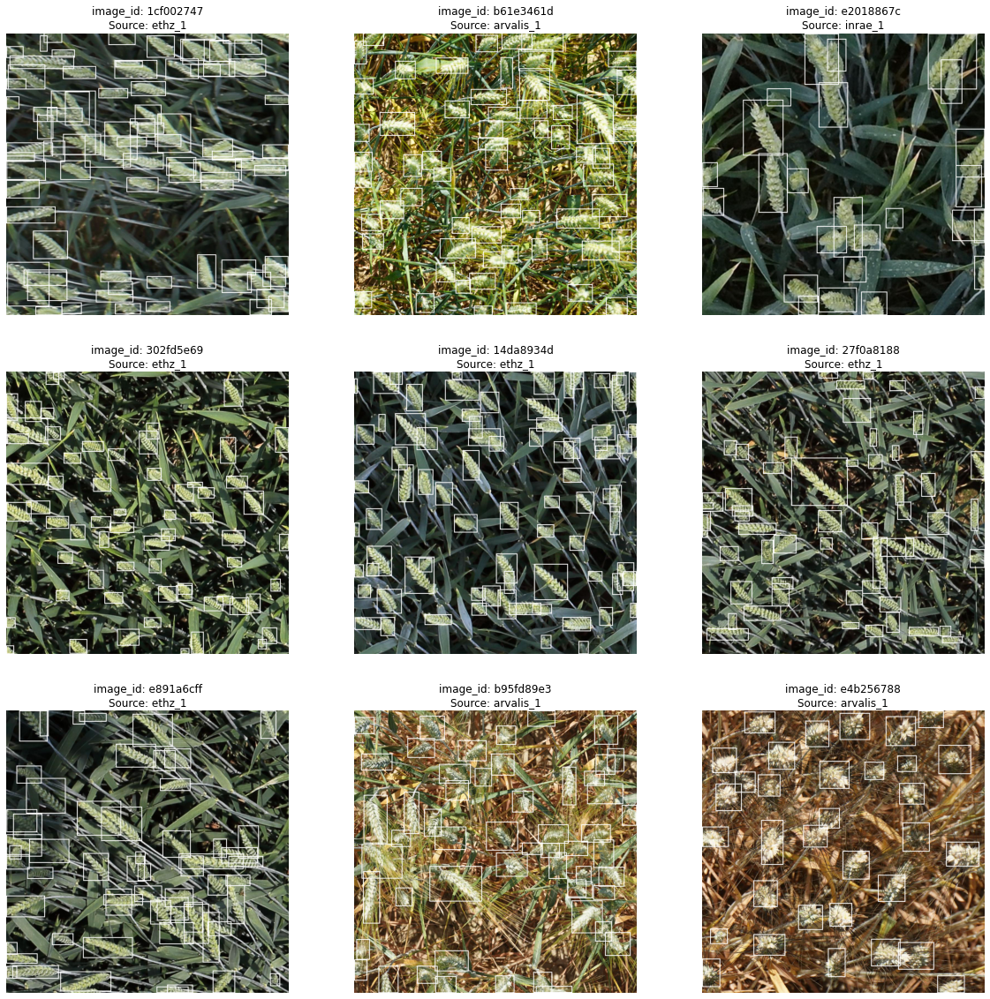

In [22]:
images = train.sample(n=9, random_state=42)['image_id'].values
# print(train.sample(n=9, random_state=42))
display_images_large(images)

**Test Data 이미지 불러오기**

In [23]:
def display_test_images(images):
    f, ax = plt.subplots(2,5, figsize=(20, 8))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TEST_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
            
        ax[i//5, i%5].imshow(image) 
        ax[i//5, i%5].axis('off')
        ax[i//5, i%5].set_title(f"image_id: {image_id}")

    plt.show()

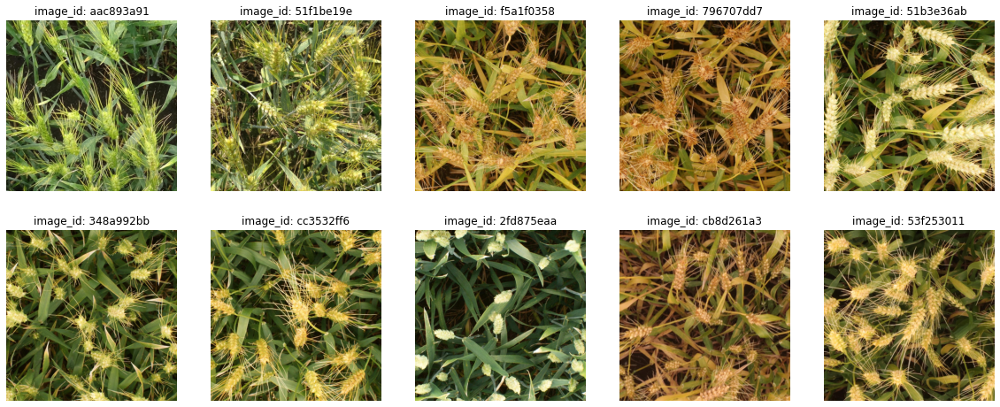

In [26]:
# since we need to predict bounding boxes for test images, 
# hence below images do not have any bounding boxes
test_images = submission.image_id.values
display_test_images(test_images)

**밀머리가 없는 이미지 불러오기**
<br>
밀머리가 없어서 밀을 찾아내면 안되는 데이터 확인하기

In [27]:
print("- 밀머리 데이터가 있는 사진 개수 : ", len(train['image_id'].unique()))
print("- 전체 사진 데이터 개수 :", len(os.listdir(TRAIN_DIR)))
print("- 밀머리 데이터가 없는 사진 개수 : ", len(os.listdir(TRAIN_DIR))-len(train['image_id'].unique()))

- 밀머리 데이터가 있는 사진 개수 :  3373
- 전체 사진 데이터 개수 : 3422
- 밀머리 데이터가 없는 사진 개수 :  49


In [28]:
wheat_image_ids = train['image_id'].unique()
all_image_ids = os.listdir(TRAIN_DIR)

no_wheat_image_ids = [ img_id 
                      for img_id in all_image_ids 
                      if img_id.split('.')[0] not in wheat_image_ids ]
print(len(no_wheat_image_ids))

49


In [29]:
def display_nowheat_images(images): 
    f, ax = plt.subplots(2,5, figsize=(20, 8))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}') #.jpg')
        image = Image.open(image_path)        
            
        ax[i//5, i%5].imshow(image) 
        ax[i//5, i%5].axis('off')
        ax[i//5, i%5].set_title(f"image_id: {image_id}")

    plt.show()

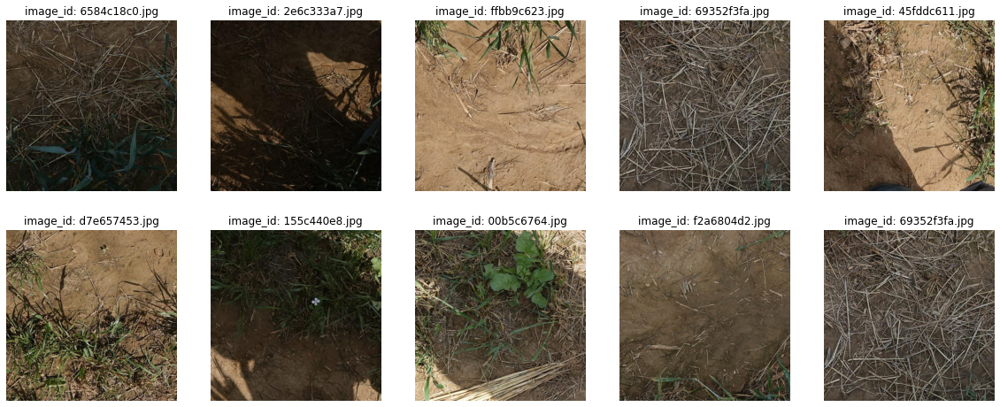

In [30]:
img_ids = np.random.choice(no_wheat_image_ids, 10)
display_nowheat_images(img_ids)

**연구소별 밀 사진**

In [31]:
sources = train['source'].unique()
print(sources)

['usask_1' 'arvalis_1' 'inrae_1' 'ethz_1' 'arvalis_3' 'rres_1' 'arvalis_2']


In [32]:
img_ids = []
for source in sources :
    df = train[train['source']==source]
    img_ids = np.append(img_ids, df['image_id'].unique()[:4]) 
    ## train[train['source'] == source]['image_id'].unique()

In [33]:
def display_source_images(images): 
    f, ax = plt.subplots(7,4, figsize=(13, 25))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        

        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]
        # draw rectangles on image
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)
                                  
        ax[i//4, i%4].imshow(image) 
        ax[i//4, i%4].axis('off')
        source = train[train['image_id'] == image_id]['source'].values[0]
        ax[i//4, i%4].set_title(f"Source: {source}\nimage_id: {image_id}")

    plt.show()

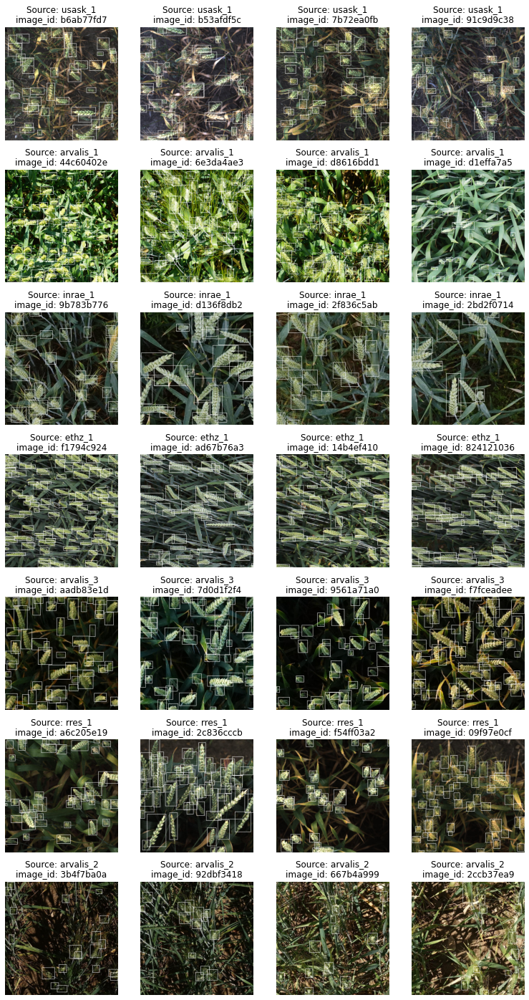

In [34]:
display_source_images(img_ids)

In [43]:
for source in sources:
    print(source)
    df2 = 
    print(df2)

usask_1
['b6ab77fd7' 'b53afdf5c' '7b72ea0fb' '91c9d9c38' '41c0123cc' 'c682d8c66'
 'e46378032' '71fd03d51' '83a5d8ac8' '02b6f199c' '1bda74f14' '3e1e66c76'
 '4a3f67d2e' '2ccec6dcc' '0435654cd' '372d12c55' 'f5093f57d' 'c6b4933f7'
 '895420d9f' '8d6bb70e5' '531acb360' '4aeb37788' 'afb7671e5' 'cc9092474'
 'c3c03e0b7' '42e247347' '5738fcf14' '31a6e55f2' 'ca4cb597b' '4e5c1078d'
 '29e44e305' '43e3ccd92' '4c7fc04f6' 'a22cdd5eb' '480c01244' '8b558e9e3'
 '029c79463' '14fd84198' '5e0a7fb4d' '798a261f0' 'b13f38e6f' 'c73f0a714'
 '69fc3d3ff' 'e99cca2a3' 'b815af10b' '999d9d27d' 'd13e3ffce' 'fd5624913'
 '005b0d8bb' 'b7c97a57b' '826d92f06' '92c92d40d' 'c86621747' '863e0253e'
 '33d37a437' '556c18af4' '43650fd9c' '43a765c3e' '4d90cdad1' '220488d01'
 '48c72c991' '49dcb7dd3' '4c02b2f7f' 'f251e40f2' '01f37f1d3' 'd7d200c0b'
 '695ae4a12' '150cabe75' '68fedffd4' '3c6f520ee' '7099cf18a' '58adb478f'
 'e91d7c41b' '4c5dc3f2b' 'a1321ca95' '8302fe8b8' '41761631b' 'ab8fa9772'
 '4f9b8d33e' '88dc94b76' '42f5d5a5e' '684a2